<a href="https://colab.research.google.com/github/waheedsabir/XAI/blob/main/large_review_yelp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install lime

     |████████████████████████████████| 275 kB 5.2 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=5b9dd7a5959683484eb43e0b51c6f1ffda42a95c7138680a1a4b9c1848dcddc1
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [3]:
!pip install shap

     |████████████████████████████████| 564 kB 5.2 MB/s 


# **Data Exploration and preprocessing**

Data used review of Indonesian Application in google playstore for classification dataset


The data consist of consumer review with 1-5 star, but we only use the data with 1 and 5 star which are labeled as negative and positive


In [5]:
import glob
import re
import pickle
import string

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from nltk.tokenize import word_tokenize

%matplotlib inline

In [6]:
files = glob.glob('*')

In [7]:
f= open('/content/drive/MyDrive/University of Pisa/XAI-Project/textdata/Tweets.csv', 'rb')

# Set up your local path
business_json_path = '/content/drive/MyDrive/University of Pisa/XAI-Project/textdata/Yelp/yelp_review_large.csv'
business = pd.read_json(business_json_path, lines=True , nrows=20)
print(business.shape)
business.head()

(54, 1)


,0
0,review_id
1,user_id
2,business_id
3,stars
4,date


In [ ]:
   
#train = pickle.load(open(files[0], 'rb'))
#test = pickle.load(open(files[1], 'rb'))

In [8]:
import csv
with open('/content/drive/MyDrive/University of Pisa/XAI-Project/textdata/Yelp/yelp_review_large.csv') as csv_yelp:
  count =  0 
  #for train data
  fsc_stars= []
  fsc_review= []
  #for test data
  fsc_stars_test=[]
  fsc_review_test=[]

  #reader= csv.reader(csv_yelp)
  reader = csv.DictReader(csv_yelp)

  for row in reader:
    count= count +1 
    #print(row)
    #print(row["stars"])
   # fsc.append(row["stars"])
    fsc_stars.append(row["stars"])
    fsc_review.append(row["text"])
   
    if count > 1000 :      
      break 
  for row in reader:
    if count > 1000:
      count= count +1 
      fsc_stars_test.append(row['stars'])
      fsc_review_test.append(row['text'])
      if count > 2000:
        break





print(fsc_stars)
print(fsc_review)
print("-----------------")
print(fsc_stars_test)
print(fsc_review_test)


['5', '5', '5', '4', '4', '5', '4', '4', '3', '5', '4', '3', '1', '3', '5', '4', '1', '3', '3', '1', '3', '4', '3', '1', '3', '3', '2', '5', '3', '4', '4', '1', '4', '4', '4', '5', '4', '4', '4', '4', '2', '4', '4', '1', '1', '4', '4', '4', '4', '4', '3', '4', '4', '2', '3', '4', '4', '4', '2', '4', '1', '1', '3', '3', '2', '5', '4', '4', '3', '3', '3', '4', '4', '1', '4', '2', '3', '4', '3', '3', '4', '1', '4', '4', '4', '4', '5', '1', '4', '4', '4', '5', '5', '1', '1', '1', '1', '4', '1', '2', '4', '4', '3', '2', '1', '2', '3', '3', '1', '2', '4', '2', '3', '2', '4', '4', '2', '1', '5', '4', '4', '5', '1', '5', '4', '1', '2', '4', '4', '2', '3', '3', '5', '4', '4', '3', '1', '4', '4', '3', '3', '4', '4', '1', '2', '4', '5', '4', '2', '4', '4', '3', '4', '3', '2', '3', '4', '2', '2', '4', '3', '2', '3', '2', '3', '4', '2', '5', '3', '4', '2', '1', '4', '4', '5', '4', '4', '5', '5', '5', '5', '3', '4', '4', '2', '4', '4', '5', '4', '3', '4', '3', '5', '4', '2', '2', '5', '4', '1', '4',

                                                content label
0     Super simple place but amazing nonetheless. It...     5
1     Small unassuming place that changes their menu...     5
2     Lester's is located in a beautiful neighborhoo...     5
3     Love coming here. Yes the place always needs t...     4
4     Had their chocolate almond croissant and it wa...     4
...                                                 ...   ...
996   Charming shop in little Italy. \n\nThe service...     5
997   This place is amazing. I'm just chiming in wit...     4
998   This bar is part of the Air Canada Centre and ...     3
999   Love Marche and have since I went as a kid to ...     4
1000  Every dish we tried was cooked to perfection w...     5

[1001 rows x 2 columns]


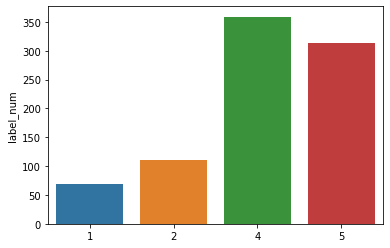

In [9]:
d_train = pd.DataFrame(data={'content': fsc_review, 'label': fsc_stars})
d_test = pd.DataFrame(data={'content': fsc_review_test, 'label': fsc_stars_test})
print(d_train)

d_train['label_num'] = d_train.label.apply(lambda x: int(re.sub('Rated | stars out of five stars', '', x)))

d_train = d_train[d_train['label_num'] != 3]

d_test['label_num'] = d_test.label.apply(lambda x: int(re.sub('Rated | stars out of five stars', '', x)))

d_test = d_test[d_test['label_num'] != 3]

plot = sns.barplot(y = d_train.label_num.value_counts(), x = d_train.label_num.value_counts().index)

plot = sns.barplot(y = d_test.label_num.value_counts(), x = d_test.label_num.value_counts().index)

In [10]:
print(d_train.head())

                                             content label  label_num
0  Super simple place but amazing nonetheless. It...     5          5
1  Small unassuming place that changes their menu...     5          5
2  Lester's is located in a beautiful neighborhoo...     5          5
3  Love coming here. Yes the place always needs t...     4          4
4  Had their chocolate almond croissant and it wa...     4          4


In [11]:
d_train.loc[d_train.label_num > 3, 'sentiment'] = 1
d_train.loc[d_train.label_num < 3, 'sentiment'] = 0

d_test.loc[d_test.label_num > 3, 'sentiment'] = 1
d_test.loc[d_test.label_num < 3, 'sentiment'] = 0

In [12]:
print(d_train.head())

                                             content  ... sentiment
0  Super simple place but amazing nonetheless. It...  ...       1.0
1  Small unassuming place that changes their menu...  ...       1.0
2  Lester's is located in a beautiful neighborhoo...  ...       1.0
3  Love coming here. Yes the place always needs t...  ...       1.0
4  Had their chocolate almond croissant and it wa...  ...       1.0

[5 rows x 4 columns]


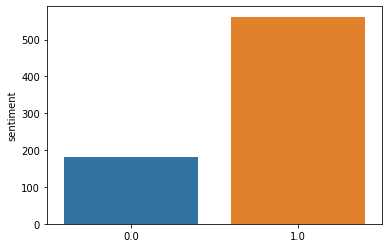

In [13]:
plot = sns.barplot(y = d_train.sentiment.value_counts(), x = d_train.sentiment.value_counts().index)

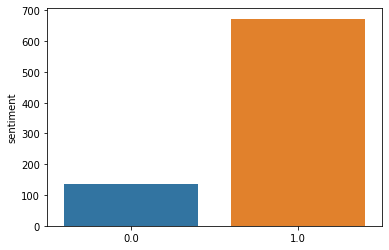

In [14]:
plot = sns.barplot(y = d_test.sentiment.value_counts(), x = d_test.sentiment.value_counts().index)

In [15]:
def remove_punctuation(word):
    for punkt in list(string.punctuation):
        word = word.replace(punkt, '')
        
    return word

In [16]:
def cleansing(text):
    text = text.lower()
    word_list = word_tokenize(text)
    word_list = [word for word in word_list if len(word) > 1]
    word_list = [remove_punctuation(word) for word in word_list]
    text = ' '.join(word_list)
    
    return text

In [17]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [18]:
d_train['content_cleansing'] = d_train.content.apply(cleansing)

d_test['content_cleansing'] = d_test.content.apply(cleansing)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


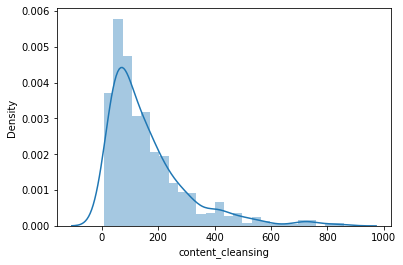

In [19]:
dist_plot = sns.distplot(d_train.content_cleansing.apply(lambda x: len(word_tokenize(x))))

In [20]:
d_train['cont_clean_len_token'] = d_train.content_cleansing.apply(lambda x: len(word_tokenize(x)))

In [21]:
d_test['cont_clean_len_token'] = d_test.content_cleansing.apply(lambda x: len(word_tokenize(x)))

In [22]:
d_train.drop(d_train[d_train['cont_clean_len_token'] == 0].index, axis = 0, inplace=True)

In [23]:
d_test.drop(d_test[d_test['cont_clean_len_token'] == 0].index, axis = 0, inplace = True)

In [24]:
d_train.reset_index(drop=True, inplace=True)
d_test.reset_index(drop=True, inplace=True)

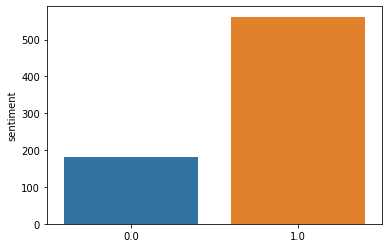

In [25]:
sns.barplot(y = d_train.sentiment.value_counts(), x = d_train.sentiment.value_counts().index)

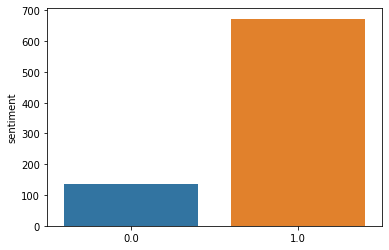

In [26]:
sns.barplot(y = d_test.sentiment.value_counts(), x = d_test.sentiment.value_counts().index)

In [27]:
text = " ".join(d_train.content_cleansing)

In [28]:
print(d_train.head())

                                             content  ... cont_clean_len_token
0  Super simple place but amazing nonetheless. It...  ...                   36
1  Small unassuming place that changes their menu...  ...                   87
2  Lester's is located in a beautiful neighborhoo...  ...                   71
3  Love coming here. Yes the place always needs t...  ...                   96
4  Had their chocolate almond croissant and it wa...  ...                   40

[5 rows x 6 columns]


In [29]:
# split the dataset into training and validation datasets 
texts_train = d_train['content'].values
texts_test = d_test['content'].values
y_train = d_train['sentiment'].values
y_test =  d_test['sentiment'].values




In [30]:
print(d_test.head())

                                             content  ... cont_clean_len_token
0  yum yum yum!\n\nWent with a party of four - we...  ...                   68
1  Amazing place for lunch.\n\nThe salads are del...  ...                  109
2  The standard for decor and atmosphere for Mont...  ...                  124
3  Stumbled upon this place when I was looking fo...  ...                  110
4  yum. yum. yum. \n\nThis is a must for any past...  ...                   83

[5 rows x 6 columns]


In [31]:
d_train.shape

(742, 6)

In [32]:
d_test.shape

(808, 6)

## **Classification Model**

# **Bi-LSTM MODEL**

In [33]:
from sklearn.base import BaseEstimator, TransformerMixin
from keras.models import Model, Input
from keras.layers import Dense, LSTM, Dropout, Embedding, SpatialDropout1D, Bidirectional, concatenate, Flatten
from keras.layers import GlobalAveragePooling1D, GlobalMaxPooling1D
from keras.utils.vis_utils import plot_model
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import accuracy_score
import regex as re
import numpy as np
class KerasTextClassifier(BaseEstimator, TransformerMixin):
    '''Wrapper class for keras text classification models that takes raw text as input.'''
    
    def __init__(self, max_words=30000, input_length=100, emb_dim=20, n_classes=3, epochs=5, batch_size=32):
        self.max_words = max_words
        self.input_length = input_length
        self.emb_dim = emb_dim
        self.n_classes = n_classes
        self.epochs = epochs
        self.bs = batch_size
        self.classes_ = None
        self.model = self._get_model()
        self.tokenizer = Tokenizer(num_words=self.max_words+1,
                                   lower=True, split=' ', oov_token="UNK")
    
    def _get_model(self):
        input_text = Input((self.input_length,))
        text_embedding = Embedding(input_dim=self.max_words + 2, output_dim=self.emb_dim,
                                   input_length=self.input_length, mask_zero=False)(input_text)
        text_embedding = SpatialDropout1D(0.5)(text_embedding)
        bilstm = Bidirectional(LSTM(units=32, return_sequences=True, recurrent_dropout=0.5))(text_embedding)
        # x = concatenate([GlobalAveragePooling1D()(bilstm), GlobalMaxPooling1D()(bilstm)])
        flatten_layer = Flatten()
        x= flatten_layer(bilstm)
        x = Dense(512, activation="relu")(x)
        x = Dropout(0.5)(x)
        out = Dense(units=self.n_classes, activation="softmax")(x)
        model = Model(input_text, out)
        model.compile(optimizer="adam",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])
        plot_model(model, to_file='model_plot.png',show_shapes=True, show_layer_names=True)
        return model
    
    def _get_sequences(self, texts):
        seqs = self.tokenizer.texts_to_sequences(texts)
        return pad_sequences(seqs, maxlen=self.input_length, value=0)
    
    def _preprocess(self, texts):
        return [re.sub(r"\d", "DIGIT", x) for x in texts]
    
    def fit(self, X, y):
        '''
        Fit the vocabulary and the model.
        
        :params:
        X: list of texts.
        y: labels.
        '''
        
        self.tokenizer.fit_on_texts(self._preprocess(X))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.max_words}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
        seqs = self._get_sequences(self._preprocess(X))
        self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)
    
    def predict_proba(self, X, y=None):
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.predict(seqs)
    
    def predict(self, X, y=None):
        return np.argmax(self.predict_proba(X), axis=1)
    
    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)
    
    def trasnform(self, X):
        return self._get_sequences(self._preprocess(X))

    def _encode_label(self, y):
        return self.label_encoder.transform(y)
        
    def _decode_label(self, y):
        return self.label_encoder.inverse_transform(y)

    def _init_label_encoder(self, y):
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(y)
        self.classes_ = self.label_encoder.classes_

    def _encode_feature(self, x):
        self.tokenizer.fit_on_texts(self._preprocess(x))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.word_cnt}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.word_cnt + 1
        return self._get_sequences(self._preprocess(x))

    def predict_decode(self, X, y=None):
        return self._decode_label(self.predict(X))
        
    def summary(self):
       return self.model.summary()
text_model = KerasTextClassifier(epochs=2, max_words=20000, input_length=200)

In [34]:
text_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200)]             0         
                                                                 
 embedding (Embedding)       (None, 200, 20)           400040    
                                                                 
 spatial_dropout1d (SpatialD  (None, 200, 20)          0         
 ropout1D)                                                       
                                                                 
 bidirectional (Bidirectiona  (None, 200, 64)          13568     
 l)                                                              
                                                                 
 flatten (Flatten)           (None, 12800)             0         
                                                                 
 dense (Dense)               (None, 512)               655411

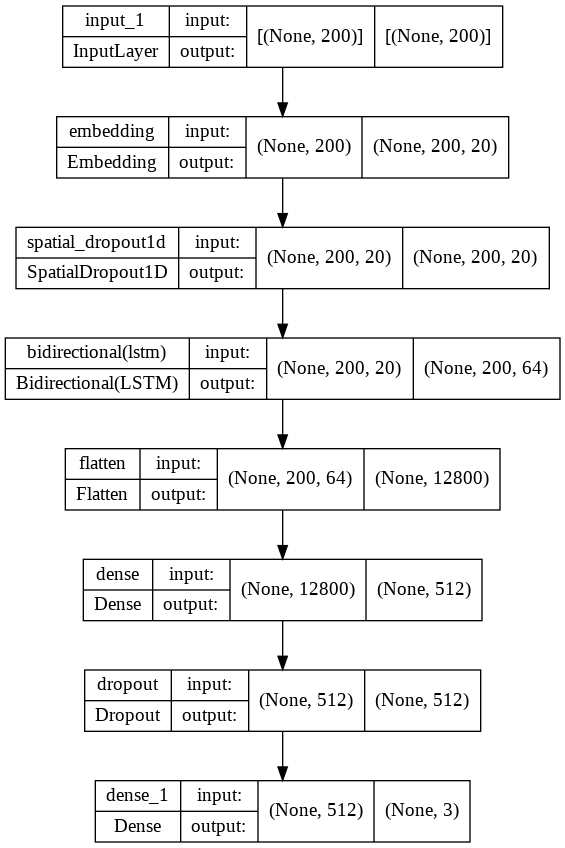

In [67]:
from IPython.display import Image
Image(filename='model_plot.png') 

In [36]:
history = text_model.fit(texts_train, y_train)

Epoch 1/2
21/21 [==============================] - 14s 382ms/step - loss: 0.6571 - accuracy: 0.7001 - val_loss: 0.5127 - val_accuracy: 0.8800
Epoch 2/2
21/21 [==============================] - 7s 348ms/step - loss: 0.5301 - accuracy: 0.7511 - val_loss: 0.4571 - val_accuracy: 0.8800


In [37]:
text_model.score(texts_test, y_test)

0.8329207920792079

## **Explaining with SHAP Explaination (kernel Explaination)**


In [38]:
encoded_x_train = text_model.trasnform(texts_train)
encoded_x_test = text_model.trasnform(texts_test)

In [39]:
def prepare_explanation_words(pipeline, encoded_x):
    words = pipeline.tokenizer.word_index
    num2word = {}
    for w in words.keys():
        num2word[words[w]] = w
    x_test_words = np.stack([
        np.array(list(map(
            lambda x: num2word.get(x, "NONE"), encoded_x[i])
                     )) for i in range(10)])

    return x_test_words

In [40]:
import shap
shap.initjs()
kernel_explainer = shap.KernelExplainer(text_model.model.predict, encoded_x_train[:20])
kernel_shap_values = kernel_explainer.shap_values(encoded_x_test[:20])

x_test_words = prepare_explanation_words(text_model, encoded_x_test)
y_pred = text_model.predict(texts_test[:20])

  0%|          | 0/20 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

In [68]:
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[6], y_pred[6]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][6], x_test_words[6])

Actual Category: 1.0, Predict Category: 1


In [69]:
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[9], y_pred[9]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][9], x_test_words[9])

Actual Category: 1.0, Predict Category: 1


In [71]:
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[8], y_pred[8]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][8], x_test_words[8])

Actual Category: 1.0, Predict Category: 1


### **Explain the Visualization** 


*   According to [paper](http://papers.nips.cc/paper/7062-a-unified-approach-to-interpreting-model-predictions.pdf) , the base value of 0.157 is the mean of prediction of all y_test. That is why, the value is not differ from all of three examples.
*   Red or Blue Features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue.

*   Similar to LIME, SHAP also has large attributes on "lumayan" , "promo", and etc

*   This force plot of Kernel Explanation explains how different features pushed and pulled on the output to move it from the base_value to the model output value or prediction. The prediction of this kernel explanation is the probability or confidence that the review is 100% belong to predicted category  ("Negative" Class).

*   Above, the word "lumayan", "promo", "membantu", etc, on the right-hand side pushing the prediction from the base value 0.157 close to 0. Zero here means that the explainer predict 0% that this review belong to the Negative class



##  **Explaining with Lime**

Sample 6: last 80 words (only part used by the model)
--------------------------------------------------
have suggestions for you on their menu. The pizza is really good - through the crust can be soggy quite quickly so eat fast! The staff are nice and organized. They accidentally burnt our pizza and remade it for us before serving it - I feel like a lot of places might have tried to get away with serving it. It's a pretty casual place and gets packed during the lunchtime office rush - but it' well worth a wait!
--------------------------------------------------
Probability(positive) = 0.79268295
True class:  1.0


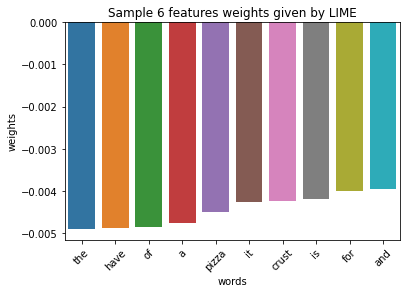

In [72]:
import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine()
# We choose a sample from test set
idx =6
idx2 =9
idx3=8
text_sample = texts_test[idx]
text_sample2 = texts_test[idx2]
text_sample3 = texts_test[idx3]
class_names = ['Negative', 'Positive']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [73]:
explanation.show_in_notebook(text=True)

Sample 9: last 80 words (only part used by the model)
--------------------------------------------------
have suggestions for you on their menu. The pizza is really good - through the crust can be soggy quite quickly so eat fast! The staff are nice and organized. They accidentally burnt our pizza and remade it for us before serving it - I feel like a lot of places might have tried to get away with serving it. It's a pretty casual place and gets packed during the lunchtime office rush - but it' well worth a wait!
--------------------------------------------------
Probability(positive) = 0.79268295
True class:  1.0


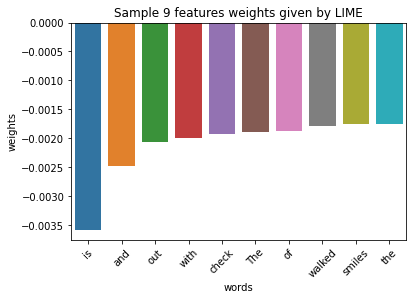

In [74]:
print('Sample {}: last 80 words (only part used by the model)'.format(idx2))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx2])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample2, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})



sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx2));

In [75]:
explanation.show_in_notebook(text=True)

Sample 8: last 80 words (only part used by the model)
--------------------------------------------------
have suggestions for you on their menu. The pizza is really good - through the crust can be soggy quite quickly so eat fast! The staff are nice and organized. They accidentally burnt our pizza and remade it for us before serving it - I feel like a lot of places might have tried to get away with serving it. It's a pretty casual place and gets packed during the lunchtime office rush - but it' well worth a wait!
--------------------------------------------------
Probability(positive) = 0.79268295
True class:  1.0


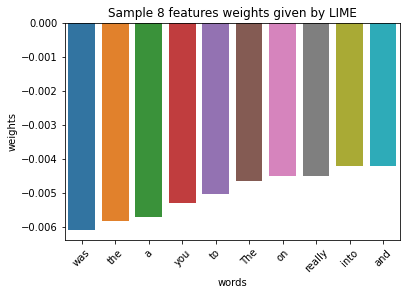

In [76]:
print('Sample {}: last 80 words (only part used by the model)'.format(idx3))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx3])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample3, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})



sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx3));

In [77]:
explanation.show_in_notebook(text=True)

### **Explain the Visualization** 


*   On the "Text with higligted words", the blue words made the classifier think that the review was more negative while the yellow words made the review seem more positive.
*   For this review, word “lumayan” , "membantu" have the highest positive score. We are able to see it clearly that those words on its own is a positif signal. And there are no negative word that gave the significant impact on the prediction.

*   The explainer predicts that this review should be labeled as "positive" with the probability of 100%.




With LIME methods of explanation, it is easy for Human to intrepret and understand the prediction. LIME allows us to extract some important word that mostly contribute to the prediction, and even give the rational number "Negative" or "Positive" contribution of each word of sample.

# **MODEL Bi-GRU-LSTM-CNN**

In [78]:
from keras.layers import concatenate, Conv1D, GRU
from keras.layers import GlobalAveragePooling1D, GlobalMaxPooling1D

from keras import backend as K 

K.clear_session()

class KerasTextClassifier(BaseEstimator, TransformerMixin):
    '''Wrapper class for keras text classification models that takes raw text as input.'''
    
    def __init__(self, max_words=30000, input_length=100, emb_dim=20, n_classes=3, epochs=5, batch_size=32):
        self.max_words = max_words
        self.input_length = input_length
        self.emb_dim = emb_dim
        self.n_classes = n_classes
        self.epochs = epochs
        self.bs = batch_size
        self.classes_ = None
        self.model = self._get_model()
        self.tokenizer = Tokenizer(num_words=self.max_words+1,
                                   lower=True, split=' ', oov_token="UNK")
    
    def _get_model(self):
        input_text = Input((self.input_length,))
        text_embedding = Embedding(input_dim=self.max_words + 2, output_dim=self.emb_dim,
                                   input_length=self.input_length, mask_zero=False)(input_text)
        text_embedding = SpatialDropout1D(0.5)(text_embedding)
        x = Bidirectional(GRU(units=32, return_sequences = True))(text_embedding)
        x = Conv1D(int(32/2), kernel_size = 2, padding = "valid", kernel_initializer = "he_uniform")(x)

        y = Bidirectional(LSTM(units=32, return_sequences=True))(text_embedding)
        y = Conv1D(int(32/2), kernel_size = 2, padding = "valid", kernel_initializer = "he_uniform")(y)
        

        avg_pool1 = GlobalAveragePooling1D()(x)
        max_pool1 = GlobalMaxPooling1D()(x)
    
        avg_pool2 = GlobalAveragePooling1D()(y)
        max_pool2 = GlobalMaxPooling1D()(y)

        x = concatenate([avg_pool1, max_pool1, avg_pool2, max_pool2])

        x = Dense(512, activation="relu")(x)
        x = Dropout(0.5)(x)
        out = Dense(units=self.n_classes, activation="softmax")(x)
        model = Model(input_text, out)
        model.compile(optimizer="adam",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])
        plot_model(model, to_file='model_plot2.png',show_shapes=True, show_layer_names=True)
        return model
    
    def _get_sequences(self, texts):
        seqs = self.tokenizer.texts_to_sequences(texts)
        return pad_sequences(seqs, maxlen=self.input_length, value=0)
    
    def _preprocess(self, texts):
        return [re.sub(r"\d", "DIGIT", x) for x in texts]
    
    def fit(self, X, y):
        '''
        Fit the vocabulary and the model.
        
        :params:
        X: list of texts.
        y: labels.
        '''
        
        self.tokenizer.fit_on_texts(self._preprocess(X))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.max_words}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
        seqs = self._get_sequences(self._preprocess(X))
        self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)
    
    def predict_proba(self, X, y=None):
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.predict(seqs)
    
    def predict(self, X, y=None):
        return np.argmax(self.predict_proba(X), axis=1)
    
    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)
    
    def trasnform(self, X):
        return self._get_sequences(self._preprocess(X))

    def _encode_label(self, y):
        return self.label_encoder.transform(y)
        
    def _decode_label(self, y):
        return self.label_encoder.inverse_transform(y)

    def _init_label_encoder(self, y):
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(y)
        self.classes_ = self.label_encoder.classes_

    def _encode_feature(self, x):
        self.tokenizer.fit_on_texts(self._preprocess(x))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.word_cnt}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.word_cnt + 1
        return self._get_sequences(self._preprocess(x))

    def predict_decode(self, X, y=None):
        return self._decode_label(self.predict(X))
        
    def summary(self):
       return self.model.summary()

text_model = KerasTextClassifier(epochs=2, max_words=20000, input_length=200)

In [51]:
text_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200)]        0           []                               
                                                                                                  
 embedding (Embedding)          (None, 200, 20)      400040      ['input_1[0][0]']                
                                                                                                  
 spatial_dropout1d (SpatialDrop  (None, 200, 20)     0           ['embedding[0][0]']              
 out1D)                                                                                           
                                                                                                  
 bidirectional (Bidirectional)  (None, 200, 64)      10368       ['spatial_dropout1d[0][0]']  

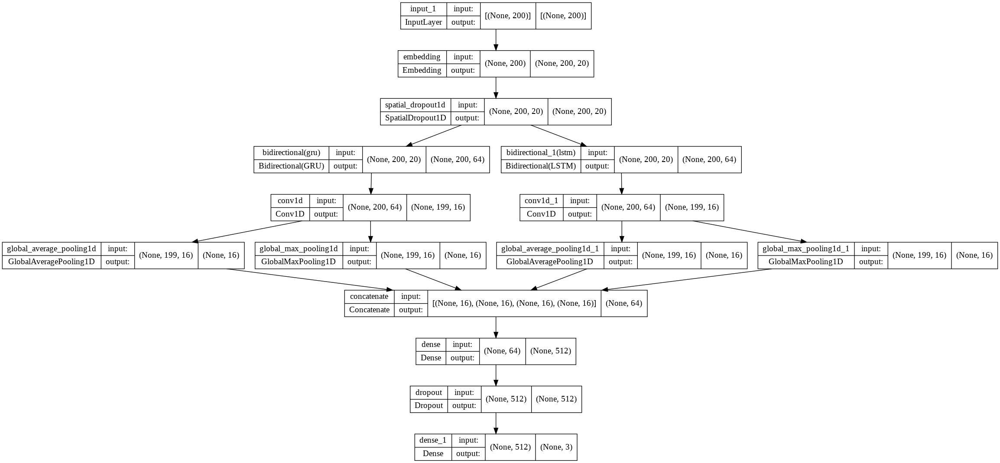

In [52]:
from IPython.display import Image
Image(filename='model_plot2.png') 

In [53]:
history = text_model.fit(texts_train, y_train)

Epoch 1/2
21/21 [==============================] - 15s 370ms/step - loss: 0.8133 - accuracy: 0.7211 - val_loss: 0.4171 - val_accuracy: 0.8800
Epoch 2/2
21/21 [==============================] - 6s 288ms/step - loss: 0.6070 - accuracy: 0.7436 - val_loss: 0.4208 - val_accuracy: 0.8800


In [54]:
text_model.score(texts_test, y_test)

0.8329207920792079

## **Explaining with SHAP Explaination (kernel Explaination)**


In [55]:
encoded_x_train = text_model.trasnform(texts_train)
encoded_x_test = text_model.trasnform(texts_test)

In [56]:
def prepare_explanation_words(pipeline, encoded_x):
    words = pipeline.tokenizer.word_index
    num2word = {}
    for w in words.keys():
        num2word[words[w]] = w
    x_test_words = np.stack([
        np.array(list(map(
            lambda x: num2word.get(x, "NONE"), encoded_x[i])
                     )) for i in range(10)])

    return x_test_words

In [57]:
import shap
shap.initjs()
kernel_explainer = shap.KernelExplainer(text_model.model.predict, encoded_x_train[:10])
kernel_shap_values = kernel_explainer.shap_values(encoded_x_test[:10])

x_test_words = prepare_explanation_words(text_model, encoded_x_test)
y_pred = text_model.predict(texts_test[:10])

  0%|          | 0/10 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

In [58]:
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[6], y_pred[6]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][6], x_test_words[6])

Actual Category: 1.0, Predict Category: 1


In [59]:
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[9], y_pred[9]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][9], x_test_words[9])

Actual Category: 1.0, Predict Category: 1


In [60]:
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[8], y_pred[8]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][8], x_test_words[8])

Actual Category: 1.0, Predict Category: 1


### **Explain the Visualization** 

*   Similar to LIME, SHAP also has large attributes on "lumayan" , "promo", and etc

*   This force plot of Kernel Explanation explains how different features pushed and pulled on the output to move it from the base_value to the model output value or prediction. The prediction of this kernel explanation is the probability or confidence that the review is 100% belong to predicted category  ("Negative" Class).

*   Above, the word "lumayan", "promo", "membantu", etc, on the right-hand side pushing the prediction from the base value 0.1246 close to 0.02. Zero here means that the explainer predict 2% that this review belong to the Negative class

##**Explaining with Lime**

Sample 6: last 80 words (only part used by the model)
--------------------------------------------------
have suggestions for you on their menu. The pizza is really good - through the crust can be soggy quite quickly so eat fast! The staff are nice and organized. They accidentally burnt our pizza and remade it for us before serving it - I feel like a lot of places might have tried to get away with serving it. It's a pretty casual place and gets packed during the lunchtime office rush - but it' well worth a wait!
--------------------------------------------------
Probability(positive) = 0.79268295
True class:  1.0


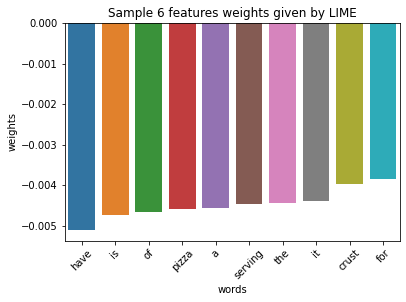

In [61]:
import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine()
# We choose a sample from test set
idx =6
idx2 =9
idx3=8
text_sample = texts_test[idx]
text_sample2 = texts_test[idx2]
text_sample3 = texts_test[idx3]
class_names = ['Negative', 'Positive']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [62]:
explanation.show_in_notebook(text=True)

Sample 9: last 80 words (only part used by the model)
--------------------------------------------------
have suggestions for you on their menu. The pizza is really good - through the crust can be soggy quite quickly so eat fast! The staff are nice and organized. They accidentally burnt our pizza and remade it for us before serving it - I feel like a lot of places might have tried to get away with serving it. It's a pretty casual place and gets packed during the lunchtime office rush - but it' well worth a wait!
--------------------------------------------------
Probability(positive) = 0.79268295
True class:  1.0


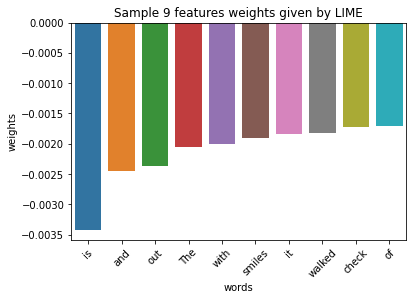

In [63]:
print('Sample {}: last 80 words (only part used by the model)'.format(idx2))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx2])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample2, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})



sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx2));

In [64]:
explanation.show_in_notebook(text=True)

Sample 8: last 80 words (only part used by the model)
--------------------------------------------------
have suggestions for you on their menu. The pizza is really good - through the crust can be soggy quite quickly so eat fast! The staff are nice and organized. They accidentally burnt our pizza and remade it for us before serving it - I feel like a lot of places might have tried to get away with serving it. It's a pretty casual place and gets packed during the lunchtime office rush - but it' well worth a wait!
--------------------------------------------------
Probability(positive) = 0.79268295
True class:  1.0


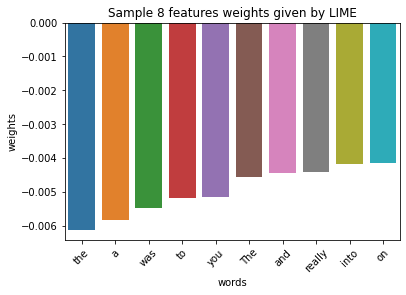

In [65]:
print('Sample {}: last 80 words (only part used by the model)'.format(idx3))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx3])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample3, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})



sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx3));

In [66]:
explanation.show_in_notebook(text=True)

### **Explain the Visualization** 


*   On the "Text with higligted words", the blue words made the classifier think that the review was more negative while the yellow words made the review seem more positive.
*   For this review, word “lumayan” , "cukup" have the highest positive score. It is different from the previous model, word "membantu" does not have significant impact score. We are able to see it clearly that those words on its own is a positif signal. And there are no negative word that gave the significant impact on the prediction.

*   The explainer predicts that this review should be labeled as "positive" with the probability of 98%.




With LIME methods of explanation, it is easy for Human to intrepret and understand the prediction. LIME allows us to extract some important word that mostly contribute to the prediction, and even give the rational number "Negative" or "Positive" contribution of each word of sample.